# Video Analytics with Azure AI

## Process
1. Frames extraction from the video file
2. Generating dense captioning from the frames using **Azure Computer Vision 4 (Florence)**
3. Generating OCR from the frames using **Azure Computer Vision 4 (Florence)**
4. Extracting the audio part from the video and speech to text generation using **Azure Speech Services**
5. Use of **Azure Open AI** and LangChain
6. Storing the results into Faiss DB
7. Creating and using a bot for a chatGPT like experience
8. An example of a webapp using GRADIO

## Documentation
- https://learn.microsoft.com/en-us/azure/cognitive-services/computer-vision/overview
- https://learn.microsoft.com/en-us/azure/cognitive-services/openai/overview

In [1]:
#%pip install opencv-python
#%pip install openai --upgrade
#%pip install langchain --upgrade
#%pip install faiss-cpu --upgrade
#%pip install wordcloud --upgrade
#%pip install azure-cognitiveservices-speech --upgrade
#%pip install moviepy --upgrade
#%pip install pytube --upgrade

In [2]:
import azure.cognitiveservices.speech as speechsdk
import cv2
import datetime
import glob
import gradio as gr
import html
import matplotlib.pyplot as plt
import numpy as np
import openai
import os
import platform
import psutil
import random
import re
import requests
import shutil
import sys
import time
import uuid

from dotenv import load_dotenv
from IPython.display import display, HTML
from IPython.display import Image
from IPython.display import Video
from IPython.display import Audio

from langchain.chains import ConversationalRetrievalChain
from langchain.chat_models import AzureChatOpenAI
from langchain.document_loaders import (DirectoryLoader, TextLoader)
from langchain.embeddings import OpenAIEmbeddings
from langchain.prompts import PromptTemplate
from langchain.text_splitter import TokenTextSplitter
from langchain.vectorstores import FAISS

from moviepy.editor import AudioFileClip
from pytube import YouTube
from pydub import AudioSegment
from scipy.io import wavfile
from tqdm import tqdm
from wordcloud import (WordCloud, STOPWORDS)

from azure.cognitiveservices.speech import (AudioDataStream,
                                            SpeechConfig,
                                            SpeechSynthesizer,
                                            SpeechSynthesisOutputFormat)
from azure.cognitiveservices.speech.audio import AudioOutputConfig

In [3]:
print("This notebook was made with Python 3.10.9")
sys.version

This notebook was made with Python 3.10.9


'3.10.9 (main, Jan 11 2023, 15:21:40) [GCC 11.2.0]'

## 1. Getting Azure services endpoints and keys from the azure.env file

> Be sure to update the azure.env file with your Azure services informations

In [4]:
load_dotenv("azure.env")

# For Azure Computer vision
AZURE_CV_KEY = os.getenv("AZURE_CV_KEY")
AZURE_CV_ENDPOINT = os.getenv("AZURE_CV_ENDPOINT")

# For Azure Speech services
AZURE_SPEECH_KEY = os.getenv("AZURE_SPEECH_KEY")
AZURE_SPEECH_REGION = os.getenv("AZURE_SPEECH_REGION")

# For Azure Open AI
openai.api_base = os.getenv("OPENAI_API_BASE")
openai.api_key = os.getenv("OPENAI_API_KEY")

# For Azure Translator
AZURE_TRANSLATOR_KEY = os.getenv("AZURE_TRANSLATOR_KEY")
AZURE_TRANSLATOR_ENDPOINT = os.getenv("AZURE_TRANSLATOR_ENDPOINT")
AZURE_TRANSLATOR_REGION = os.getenv("AZURE_TRANSLATOR_REGION")

## 2. Directories creation

In [7]:
VIDEO_DIR = "videos"

os.makedirs(VIDEO_DIR, exist_ok=True)

In [8]:
FRAMES_DIR = "frames"

if os.path.exists(FRAMES_DIR):
    print("Deleting the frames dir...")
    shutil.rmtree(FRAMES_DIR)
    print("Done")

print("Creating directory")
os.makedirs(FRAMES_DIR, exist_ok=True)
print("Done")

Creating directory
Done


In [9]:
RES_DIR = "metadata"

if os.path.exists(RES_DIR):
    shutil.rmtree(RES_DIR)

os.makedirs(RES_DIR, exist_ok=True)

In [10]:
# Files to be generated during the process
captions_file = os.path.join(RES_DIR, 'captions.txt')
ocr_file = os.path.join(RES_DIR, 'ocr.txt')
speech_file = os.path.join(RES_DIR, 'speech.txt')

In [11]:
AUDIO_DIR = 'audio'

os.makedirs(AUDIO_DIR, exist_ok=True)

In [12]:
OUTPUT_DIR = "outputs"

os.makedirs(OUTPUT_DIR, exist_ok=True)

In [13]:
FAISS_DIR = "faiss"

os.makedirs(FAISS_DIR, exist_ok=True)

## 3. Downloading a video

In [14]:
youtube_video = "https://www.youtube.com/watch?v=yLbcWloJ_tI"

try:
    print("Downloading the video...")
    start = time.time()

    yt = YouTube(youtube_video)
    stream = yt.streams.get_highest_resolution()
    stream.download(VIDEO_DIR)

    elapsed = time.time() - start
    print("Done")
    print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

except:
    print("Retry")

Done
Elapsed time: 00:00:02.331481


In [15]:
os.listdir(VIDEO_DIR)

['Working at Microsoft.mp4']

In [16]:
video_file = "videos/Working at Microsoft.mp4"

In [17]:
Video(video_file, width=860)

## 4. Extracting the frames from the video

In [18]:
nbsecs = 1  # get 1 frame each 1 second

frame_count = 0
video = cv2.VideoCapture(video_file)
fps = int(video.get(cv2.CAP_PROP_FPS))

print("Getting frames from the video...")
print("FPS =", fps)
print()

while True:
    ret, frame = video.read()

    if not ret:
        break

    if frame_count % (fps * nbsecs) == 0:
        cv2.imwrite(
            FRAMES_DIR + "/" + f"frame_{frame_count // (fps * nbsecs):09}.jpg",
            frame)

    if frame_count % 1000 == 0:
        print("Please wait... Reading frames:", frame_count)

    frame_count += 1

print("\nDone")
print("Number of extracted frames =", len(os.listdir(FRAMES_DIR)))

Getting frames from the video...
FPS = 23

Please wait... Reading frames: 0
Please wait... Reading frames: 1000
Please wait... Reading frames: 2000
Please wait... Reading frames: 3000

Done
Number of extracted frames = 145


## 5. Azure Computer Vision 4 (florence)

In [19]:
# use of options denseCaptions (for dense captioning) and read (for OCR) for Azure Computer Vision

features = "&features=denseCaptions,read"
language = "&language=en"

url = AZURE_CV_ENDPOINT +\
"/computervision/imageanalysis:analyze?api-version=2023-02-01-preview"\
+ features + language

headers = {
    'Content-type': 'application/octet-stream',
    'Ocp-Apim-Subscription-Key': AZURE_CV_KEY,
}

## 6. Testing Azure Computer Vision on a single frame

In [20]:
frames = [file for file in glob.glob(FRAMES_DIR + '/*.jpg')]
print("Number of frames:", len(frames))

Number of frames: 145


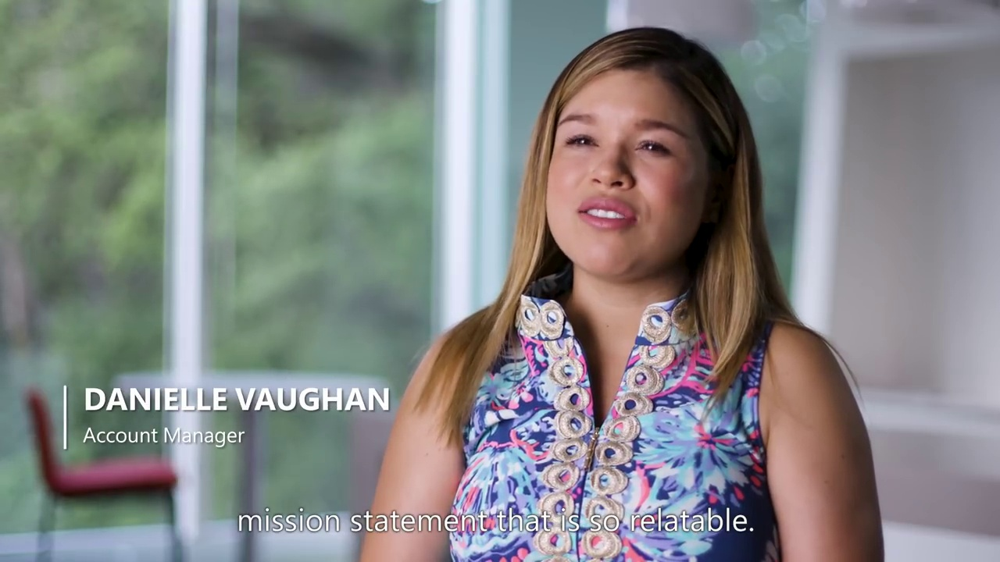

In [21]:
frameid = 100

Image(filename=frames[frameid], width=640)

### Running Azure CV for DenseCaptionning and OCR

In [22]:
max_attempts = 3
attempt = 1

while attempt <= max_attempts:
    with open(frames[frameid], 'rb') as f:
        img = f.read()

    r = requests.post(url, data=img, headers=headers)

    if r.status_code >= 200 and r.status_code < 300:
        caption = r.json()
        break  # Exit the loop
    else:
        time.sleep(1)  # Wait for 1 second before retrying

if attempt > max_attempts:
    print()
else:
    # Request was successful
    # Process the response
    pass

In [25]:
densecaptions = r.json()["denseCaptionsResult"]["values"]
densecaptions

[{'text': 'a woman in a blue and pink vest',
  'confidence': 0.4064728915691376,
  'boundingBox': {'x': 0, 'y': 0, 'w': 1280, 'h': 720}},
 {'text': 'a woman in a blue and pink shirt',
  'confidence': 0.3599172532558441,
  'boundingBox': {'x': 448, 'y': 18, 'w': 668, 'h': 679}},
 {'text': 'a red chair with white text',
  'confidence': 0.43897029757499695,
  'boundingBox': {'x': 29, 'y': 493, 'w': 197, 'h': 220}},
 {'text': "a close up of a woman's chest",
  'confidence': 0.4878372550010681,
  'boundingBox': {'x': 652, 'y': 361, 'w': 249, 'h': 349}},
 {'text': 'a woman with blonde hair',
  'confidence': 0.5129618644714355,
  'boundingBox': {'x': 616, 'y': 23, 'w': 401, 'h': 419}},
 {'text': 'a close-up of a sign',
  'confidence': 0.42297276854515076,
  'boundingBox': {'x': 47, 'y': 457, 'w': 455, 'h': 250}}]

In [26]:
ocr = r.json()["readResult"]["content"]
print(ocr)

DANIELLE VAUGHAN
Account Manager
mission statement that is so relatable.


## 7. Captions using Azure CV4 on each extracted frame

In [27]:
def capitalize(text):
    """
    Capitalize strings
    """
    sentences = re.split(r'(?<=[.!?])\s+', text)
    capitalized_sentences = [sentence.capitalize()
                             for sentence in sentences]
    result = ' '.join(capitalized_sentences)

    return result

In [28]:
if os.path.exists(captions_file):
    os.remove(captions_file)

if os.path.exists(ocr_file):
    os.remove(ocr_file)

captions_list = []
ocr_list = []
max_attempts = 100
attempt = 1

print("Processing all frames with Azure Computer Vision 4\n")

for frame in tqdm(frames):
    with open(frame, 'rb') as f:
        img = f.read()

    while attempt <= max_attempts:
        r = requests.post(url, data=img, headers=headers)

        if r.status_code >= 200 and r.status_code < 300:
            # Getting all the dense captions
            dense_captions = r.json()["denseCaptionsResult"]["values"]
            # All dense captions into a single string
            dense_captions = capitalize('. '.join(
                [d['text'] for d in dense_captions]))

            # Running OCR
            ocr = r.json()["readResult"]["content"].replace('\n', ' ')

            # Saving the results
            captions_list.append(dense_captions)
            ocr_list.append(ocr)

            break

        else:
            attempt += 1
            time.sleep(1)  # pause 1 sec

    if attempt > max_attempts:
        print("!Maximum number of attempts reached")
    else:
        pass

# Writing all the captions from Azure Computer Vision 4
# into a text file
captions_list = '. '.join(captions_list)

with open(captions_file, 'w') as file:
    file.write(str(captions_list))

# Writing all the OCR results from Azure Computer Vision 4
# into a text file
ocr_list = '. '.join(ocr_list)
with open(ocr_file, 'w') as file:
    file.write(str(ocr_list))

print("Done")

Processing all frames with Azure Computer Vision 4



100%|██████████| 145/145 [02:49<00:00,  1.17s/it]

Done


We have now the OCR text and the captions in txt files:

In [29]:
os.listdir(RES_DIR)

['captions.txt', 'ocr.txt']

## 8. Speech to text with Azure Speech Services

### Exporting the audio from the video file into a wav file using moviepy

In [30]:
# Audio file to generate
audio_file = 'audio.wav'

audio_filename = os.path.join(AUDIO_DIR, audio_file)
print("Exporting the audio from the video file...")
sound = AudioFileClip(video_file)
sound.write_audiofile(audio_filename, 44100, 2, 2000, "pcm_s32le")
print("Done\n")

Exporting the audio from the video file...
MoviePy - Writing audio in audio/audio.wav


MoviePy - Done.
Done



We have now the audio file from the video file:

In [36]:
os.listdir(AUDIO_DIR)

['audio.wav']

In [32]:
# Language of our audio file
language = 'en-US'

In [33]:
speech_config = speechsdk.SpeechConfig(subscription=AZURE_SPEECH_KEY,
                                       region=AZURE_SPEECH_REGION)

audio_input = speechsdk.audio.AudioConfig(filename=audio_filename)
speech_config.speech_recognition_language = language
speech_config.request_word_level_timestamps()
speech_config.enable_dictation()
speech_config.output_format = speechsdk.OutputFormat(1)
speech_recognizer = speechsdk.SpeechRecognizer(speech_config=speech_config,
                                               audio_config=audio_input)
speech_text = []


def handle_final_result(evt):
    """
    Append speech results
    """
    speech_text.append(evt.result.text)


done = False


def stop_cb(evt):
    print('Closing on {}'.format(evt))
    speech_recognizer.stop_continuous_recognition()
    global done
    done = True


speech_recognizer.recognized.connect(handle_final_result)
# Connect callbacks to the events fired by the speech recognizer
# & displays the info/status
speech_recognizer.recognizing.connect(
    lambda evt: print('RECOGNIZING: {}'.format(evt)))
speech_recognizer.recognized.connect(
    lambda evt: print('RECOGNIZED: {}'.format(evt)))
speech_recognizer.session_started.connect(
    lambda evt: print('SESSION STARTED: {}'.format(evt)))
speech_recognizer.session_stopped.connect(
    lambda evt: print('SESSION STOPPED {}'.format(evt)))
speech_recognizer.canceled.connect(
    lambda evt: print('CANCELED {}'.format(evt)))

speech_recognizer.session_stopped.connect(stop_cb)
speech_recognizer.canceled.connect(stop_cb)
speech_recognizer.start_continuous_recognition()

while not done:
    time.sleep(.5)

# Delete previous file
if os.path.exists(speech_file):
    os.remove(speech_file)

# Saving file with speech to text results
speech_text = '. '.join(speech_text)

with open(speech_file, 'w') as file:
    file.write(str(speech_text))
    
print("\nDone")

SESSION STARTED: SessionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d)
RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=4927cb43c9874090880d7d34630dde31, text="i", reason=ResultReason.RecognizingSpeech))
RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=4f436f951a4641dda5172d63c81d8349, text="i love the", reason=ResultReason.RecognizingSpeech))
RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=6215ad30155941e8b75c8cfbd487e1de, text="i love the respect that", reason=ResultReason.RecognizingSpeech))
RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=274822f3421f44cd853d1dd8b03e31aa, text="i love the respect that comes", reason=ResultReason.RecognizingSpeech))
RECOGNIZING: SpeechRec

RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=ccf0557db19844d18e0669f1bb1a652b, text="i love the respect that comes with working for such a large company and the impact i fixed a bug that impacted 100,000 customers and i did it in seconds and that's crazy nothing that i do", reason=ResultReason.RecognizingSpeech))
RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=9d3c7fc37e584311bcc90b522e005c82, text="i love the respect that comes with working for such a large company and the impact i fixed a bug that impacted 100,000 customers and i did it in seconds and that's crazy nothing that i do touches that", reason=ResultReason.RecognizingSpeech))
RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=8aaae028f98a4c05b02272d43ca63a10, text="i love the respect that comes

RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=e91e162c081d444db086fadc3b3fb0e4, text="no matter really what product you're working on if it's leaving the four walls of microsoft it's going to impact at least millions of people that motivation alone really changes your whole compass", reason=ResultReason.RecognizingSpeech))
RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=5cc6c1ff4c8a420e91e7a157de4e876d, text="no matter really what product you're working on if it's leaving the four walls of microsoft it's going to impact at least millions of people that motivation alone really changes your whole compass everyone", reason=ResultReason.RecognizingSpeech))
RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=6ade277c6ed74eb487b61c9c92e6a43d, text="no matter reall

RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=f44818d626964ec78e165b5dcd569e28, text="no matter really what product you're working on if it's leaving the four walls of microsoft it's going to impact at least millions of people that motivation alone really changes your whole compass everyone is very supportive and everyone has a growth mindset and they want to learn more microsoft supports you and developing yourself as an individual because they", reason=ResultReason.RecognizingSpeech))
RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=083fdf01c5bc43579179d9d86b1af9ac, text="no matter really what product you're working on if it's leaving the four walls of microsoft it's going to impact at least millions of people that motivation alone really changes your whole compass everyone is very supportive and everyone has a growth mindset and

RECOGNIZED: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=1098a63ed07745199ef241f83751665b, text="No matter really what product you're working on, if it's leaving the four walls of Microsoft, it's going to impact at least millions of people. That motivation alone really changes your whole compass. Everyone is very supportive and everyone has a growth mindset and they want to learn more. Microsoft supports you in developing yourself as an individual because they understand if as an individual you're developed, you'll end up only helping them better in the company. Managers really encourage you to get involved.", reason=ResultReason.RecognizedSpeech))
RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=4c31d2ca467e4095a1eaec0db77b027b, text="in other", reason=ResultReason.RecognizingSpeech))
RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93d

RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=adc46d5381e147389ad9cac1753d304a, text="in other things outside of work whether that's doing a hackathon or being part of the gift campaign because it's such a big part of microsoft's culture one of the biggest passions i have is teaching younger students specifically girls that", reason=ResultReason.RecognizingSpeech))
RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=323d9373c745469fb24f8ca27e53736d, text="in other things outside of work whether that's doing a hackathon or being part of the gift campaign because it's such a big part of microsoft's culture one of the biggest passions i have is teaching younger students specifically girls that computer", reason=ResultReason.RecognizingSpeech))
RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=Spe

RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=9fafcf6bba9640ef93b919762d07e0e5, text="in other things outside of work whether that's doing a hackathon or being part of the gift campaign because it's such a big part of microsoft's culture one of the biggest passions i have is teaching younger students specifically girls that computer science can be a girl thing it is awesome that microsoft supports me using my work hours to teach these middle", reason=ResultReason.RecognizingSpeech))
RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=c813d00deffc49e1817d6f97b46d63f9, text="in other things outside of work whether that's doing a hackathon or being part of the gift campaign because it's such a big part of microsoft's culture one of the biggest passions i have is teaching younger students specifically girls that computer science can be a 

RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=853bf075b24b4433b41ca37085b6138d, text="in other things outside of work whether that's doing a hackathon or being part of the gift campaign because it's such a big part of microsoft's culture one of the biggest passions i have is teaching younger students specifically girls that computer science can be a girl thing it is awesome that microsoft supports me using my work hours to teach these middle school girls DJ both in seattle and across the country on weekends because i was able to share those different things with my manager", reason=ResultReason.RecognizingSpeech))
RECOGNIZED: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=447e040843514604bd1072d485cfb880, text="In other things outside of work, whether that's doing a hackathon or being part of the gift campaign because it's such a big part of 

RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=2243f6b2d31a4c90b4921aec1ef1b6ed, text="we are encouraged to continue learning my team is OK that i'm gone every once in a while for diversity recruiting or a conference to learn and better myself", reason=ResultReason.RecognizingSpeech))
RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=2bfead55d72f450b9fc23438c218a453, text="we are encouraged to continue learning my team is OK that i'm gone every once in a while for diversity recruiting or a conference to learn and better myself i", reason=ResultReason.RecognizingSpeech))
RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=23b5a79978fb413aaf95415955553a26, text="we are encouraged to continue learning my team is OK that i'm gone every once in a while for diversity

RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=4b906f00a48646efb26b78f23afdff79, text="we are encouraged to continue learning my team is OK that i'm gone every once in a while for diversity recruiting or a conference to learn and better myself i really love working at a company that has a mission statement that is so relatable we know what we want to empower every single human on this planet to do more", reason=ResultReason.RecognizingSpeech))
RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=41dbfd9639524947aff9958c6fdefd80, text="we are encouraged to continue learning my team is OK that i'm gone every once in a while for diversity recruiting or a conference to learn and better myself i really love working at a company that has a mission statement that is so relatable we know what we want to empower every single human on this planet

RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=dc9dce3da82d4104b45a632c7b1fe118, text="we are encouraged to continue learning my team is OK that i'm gone every once in a while for diversity recruiting or a conference to learn and better myself i really love working at a company that has a mission statement that is so relatable we know what we want to empower every single human on this planet to do more a company that encourages diversity and inclusion where i being a woman latina and tech feel 100% supported and", reason=ResultReason.RecognizingSpeech))
RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=e9ba281db5cc4b5ebed45f24102fb82f, text="we are encouraged to continue learning my team is OK that i'm gone every once in a while for diversity recruiting or a conference to learn and better myself i really love working at a company tha

RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=3046fd7609e4470ca677f978f885c090, text="it really makes the picture complete i wholeheartedly believe i'm making an impact in people's lives there's not too many feelings in", reason=ResultReason.RecognizingSpeech))
RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=427467a7c52b4ead910dccda29e6b4b1, text="it really makes the picture complete i wholeheartedly believe i'm making an impact in people's lives there's not too many feelings in this world that", reason=ResultReason.RecognizingSpeech))
RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=f02a03838e13430195ab0cb55ef13322, text="it really makes the picture complete i wholeheartedly believe i'm making an impact in people's lives there's not too many feelings in 

RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=dfbd7d264c264d739628f190f57ab86d, text="it really makes the picture complete i wholeheartedly believe i'm making an impact in people's lives there's not too many feelings in this world that make you feel better than that i'm just inspired every day the culture itself is inspiring the people around me are inspiring and what the company allows us to do", reason=ResultReason.RecognizingSpeech))
RECOGNIZING: SpeechRecognitionEventArgs(session_id=b0bf93dd4139417cacf2d8097d38454d, result=SpeechRecognitionResult(result_id=80637ac67130465e85d93600fafe8082, text="it really makes the picture complete i wholeheartedly believe i'm making an impact in people's lives there's not too many feelings in this world that make you feel better than that i'm just inspired every day the culture itself is inspiring the people around me are inspiring and what the company allows us to do 

### Viewing the speech file

We have now the speech to text file:

In [34]:
os.listdir(RES_DIR)

['captions.txt', 'ocr.txt', 'speech.txt']

In [35]:
with open(speech_file, 'r') as f:
    print(f.read())

I love the respect that comes with working for such a large company and the impact. I fixed a bug that impacted 100,000 customers and I did it in seconds, and that's crazy. Nothing that I do touches that many people.. No matter really what product you're working on, if it's leaving the four walls of Microsoft, it's going to impact at least millions of people. That motivation alone really changes your whole compass. Everyone is very supportive and everyone has a growth mindset and they want to learn more. Microsoft supports you in developing yourself as an individual because they understand if as an individual you're developed, you'll end up only helping them better in the company. Managers really encourage you to get involved.. In other things outside of work, whether that's doing a hackathon or being part of the gift campaign because it's such a big part of Microsoft's culture. One of the biggest passions I have is teaching younger students, specifically girls, that computer science c

## 9. WordClouds

So we have 3 files (captions, ocr and speech):

In [37]:
os.listdir(RES_DIR)

['captions.txt', 'ocr.txt', 'speech.txt']

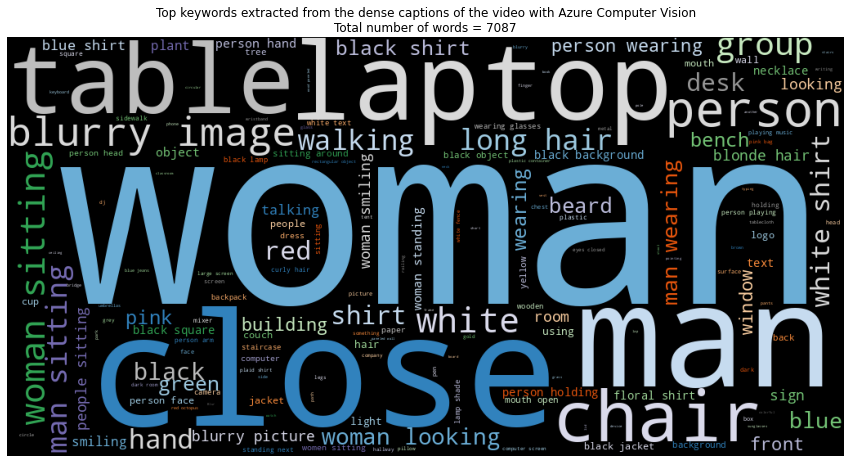

In [38]:
wordcloud = WordCloud(width=1024,
                      height=512,
                      background_color='black',
                      colormap='tab20c').generate(captions_list)

plt.figure(figsize=(15, 8))
plt.imshow(wordcloud)
plt.axis("off")

title = "Top keywords extracted from the dense captions of the video with Azure Computer Vision\
\nTotal number of words = " + str(len(captions_list.split()))
plt.title(title)

plt.savefig(os.path.join(OUTPUT_DIR, "wordcloud_densecaptions.png"))
plt.show()

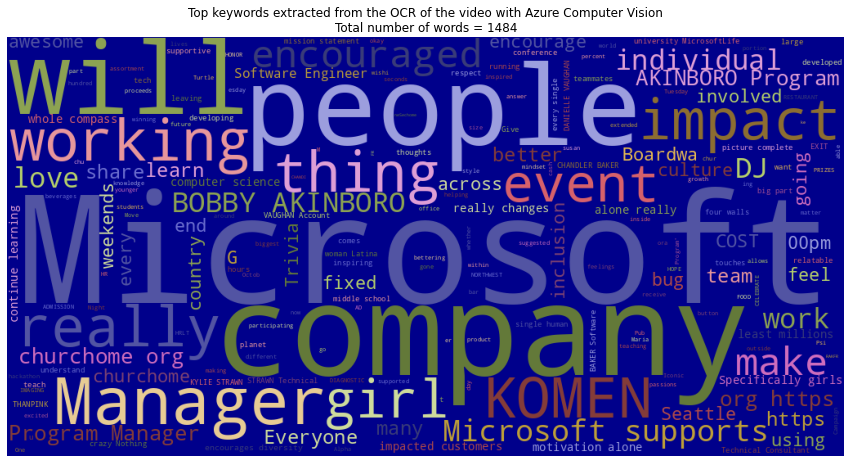

In [39]:
wordcloud = WordCloud(width=1024,
                      height=512,
                      background_color='darkblue',
                      colormap='tab20b').generate(ocr_list)

plt.figure(figsize=(15, 8))
plt.imshow(wordcloud)
plt.axis("off")

title = "Top keywords extracted from the OCR of the video with Azure Computer Vision\
\nTotal number of words = " + str(len(ocr_list.split()))
plt.title(title)

plt.savefig(os.path.join(OUTPUT_DIR, "wordcloud_ocr.png"))
plt.show()

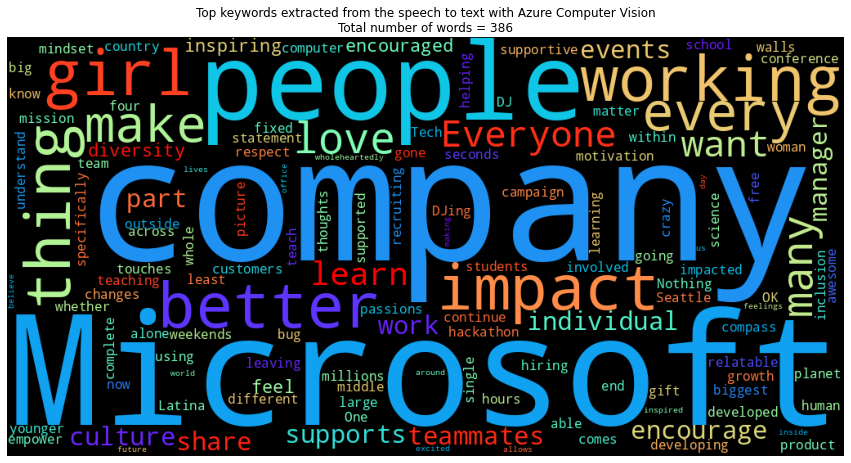

In [42]:
# To remove the non useful words
stop_words = STOPWORDS.update(["really"])

wordcloud = WordCloud(width=1024,
                      height=512,
                      stopwords=stop_words,
                      background_color='black',
                      colormap='rainbow').generate(speech_text)

plt.figure(figsize=(15, 8))
plt.imshow(wordcloud)
plt.axis("off")

title = "Top keywords extracted from the speech to text with Azure Computer Vision\
\nTotal number of words = " + str(len(speech_text.split()))
plt.title(title)

plt.savefig(os.path.join(OUTPUT_DIR, "wordcloud_speech.png"))
plt.show()

## 10. Creating the Chat-GPT like experience for videos analytics

 For this, we’ll be using **LangChain, Azure OpenAI Service, and Faiss as our vector store**. 
 
 > As the underlying Large Language Model, we’ll be using gpt-3.5-turbo (the “ChatGPT” model).

In [43]:
# Initialize gpt-35-turbo and our embedding model
# You should have deployed them from the Azure OpenAI Studio with the same name

openai.api_type = "azure"
openai.api_version = "2023-03-15-preview"

llm_model = "gpt-35-turbo"
embeddings_model = "text-embedding-ada-002"

# Large Language Model to use
llm = AzureChatOpenAI(
    deployment_name=llm_model,
    openai_api_version=openai.api_version,
    temperature=0.9,
    max_retries=6,
)

# Model embeddings to use
embeddings = OpenAIEmbeddings(model=embeddings_model,
                              chunk_size=1,
                              max_retries=6,
                             )

### Azure Open AI models

In [44]:
llm

AzureChatOpenAI(verbose=False, callback_manager=<langchain.callbacks.shared.SharedCallbackManager object at 0x7f10e40f8c70>, client=<class 'openai.api_resources.chat_completion.ChatCompletion'>, model_name='gpt-3.5-turbo', temperature=0.9, model_kwargs={}, openai_api_key='', openai_organization='', request_timeout=60, max_retries=6, streaming=False, n=1, max_tokens=None, deployment_name='gpt-35-turbo', openai_api_type='azure', openai_api_base='', openai_api_version='2023-03-15-preview')

In [45]:
embeddings

OpenAIEmbeddings(client=<class 'openai.api_resources.embedding.Embedding'>, model='text-embedding-ada-002', document_model_name='text-embedding-ada-002', query_model_name='text-embedding-ada-002', embedding_ctx_length=8191, openai_api_key=None, openai_organization=None, allowed_special=set(), disallowed_special='all', chunk_size=1, max_retries=6)

> Faiss is a library for efficient similarity search and clustering of dense vectors. It contains algorithms that search in sets of vectors of any size, up to ones that possibly do not fit in RAM. It also contains supporting code for evaluation and parameter tuning. Faiss is written in C++ with complete wrappers for Python/numpy.

In [46]:
# Loading all the text documents from the dir
loader = DirectoryLoader(RES_DIR, glob="*.txt", loader_cls=TextLoader)

documents = loader.load()
text_splitter = TokenTextSplitter(chunk_size=1000, chunk_overlap=0)
docs = text_splitter.split_documents(documents)

In [47]:
print("Loading the documents into Faiss DB")
faiss_db = FAISS.from_documents(documents=docs, embedding=embeddings)
print("Done")

Loading the documents into Faiss DB
Done


In [48]:
# Quick test
docs_and_scores = faiss_db.similarity_search_with_score("a white shirt with a necklace")
docs_and_scores[0]

(Document(page_content=". A woman speaking to a window. A woman in a blue and pink shirt. A red chair with white text. A close up of a woman's shirt. A close up of a person's mouth. A woman with blonde hair. A woman in a blue and pink vest. A woman in a blue and pink shirt. A red chair with white text. A close up of a woman's chest. A woman with blonde hair. A close-up of a sign. A woman in a blue and pink sleeveless shirt. A woman in a blue and white shirt. A red arm rest on a chair. A close up of a woman's shirt. A woman with blonde hair. A man holding his fingers up. A man with a beard and a white shirt. A close up of a gold bracelet. A close up of hands. A man with a beard. A close up of a white shirt. A close up of a chair. A close up of a man's mouth. A man in a white shirt. A man in a white shirt. A man wearing a necklace. A white and black sign. A man with a beard. A man in a white shirt. A man in a white shirt. A man wearing a necklace. A white and black sign. A man smiling fo

In [49]:
#faiss_db.docstore._dict

In [56]:
print("Saving the Faiss database")
faiss_db.save_local(os.path.join(FAISS_DIR, "faiss_index"))
print("Done\n")

Saving the Faiss database
Done



In [57]:
os.listdir(FAISS_DIR)

['faiss_index']

### Prompt Template definition

In [58]:
CONDENSE_QUESTION_PROMPT = PromptTemplate.from_template(
    """Could you answer to this question.

Chat History:
{chat_history}
Follow Up Input: {question}
Standalone question:""")

qa = ConversationalRetrievalChain.from_llm(
    llm=llm,
    retriever=faiss_db.as_retriever(),
    condense_question_prompt=CONDENSE_QUESTION_PROMPT,
    return_source_documents=True,
    verbose=False)

In [59]:
def generate_html_output(result):
    """
    HTML output
    """
    question = html.escape(result["question"])
    answer = html.escape(result["answer"])
    today = datetime.datetime.today().strftime('%d-%b-%Y %H:%M:%S')

    output = f"""
    <html>
        <head>
            <img src="chatbot.gif" width="640">
            <style>
                p.question {{
                    color: blue;
                }}
                p.answer {{
                    color: green;
                }}

            </style>
        </head>
    <body>
        <p class="question"><b>{today}</b></p>
        <h3 class="question">Your question:</h3>
        <p class="question">{question}</p>
        <h3 class="question">My answer:</h3>
        <p class="answer">{answer}</p>
    
        <h5 class="powered">Powered by Azure AI</h5>
    
    </body>
    <br>
    </html>
    """

    return output

In [60]:
def video_chatbot(query, returndoc=False):
    """
    Custom chatbot using Azure OpenAI and Azure Cognitive Services on videos
    """
    chat_history = []
    output_txt = os.path.join(OUTPUT_DIR, "answer.txt")

    try:
        result = qa({"question": query, "chat_history": chat_history})
        # Generate the HTML output
        html_ask = generate_html_output(result)
        # Display the HTML output
        display(HTML(html_ask))
        
        # Saving the answer into a text file
        with open(output_txt, "w") as file:
            file.write(result["answer"])

        if returndoc:
            print(result['source_documents'][0])
    
    except:
        print("Error. Please try again")

In [61]:
def audio_playback(lang='EN'):
    """
    Text to speech in English with Azure Speech services to read the answer
    """
    input_file = os.path.join(OUTPUT_DIR, "answer.txt")
    output_file = os.path.join(AUDIO_DIR, "output.wav")

    path = '/translate?api-version=3.0'
        
    # Available Microsoft neural voices
    # https://learn.microsoft.com/en-us/azure/cognitive-services/speech-service/language-support?tabs=tts
    #
    # Check voice gallery: https://speech.microsoft.com/portal/voicegallery

    voice_list_en = [
        "en-US-AmberNeural",
        "en-US-AnaNeural",
        "en-US-AriaNeural",
        "en-US-AshleyNeural",
        "en-US-BrandonNeural",
        "en-US-ChristopherNeural",
        "en-US-CoraNeural",
        "en-US-DavisNeural",
        "en-US-ElizabethNeural",
        "en-US-EricNeural",
        "en-US-GuyNeural",
        "en-US-JacobNeural",
        "en-US-JaneNeural",
        "en-US-JasonNeural",
        "en-US-JennyNeural",
        "en-US-MichelleNeural",
        "en-US-MonicaNeural",
        "en-US-NancyNeural",
        "en-US-RogerNeural1",
        "en-US-SaraNeural",
        "en-US-SteffanNeural",
        "en-US-TonyNeural",
        "en-GB-AbbiNeural",
        "en-GB-AlfieNeural",
        "en-GB-BellaNeural",
        "en-GB-ElliotNeural",
        "en-GB-EthanNeural",
        "en-GB-HollieNeural",
        "en-GB-LibbyNeural",
        "en-GB-MaisieNeural",
        "en-GB-NoahNeural",
        "en-GB-OliverNeural",
        "en-GB-OliviaNeural",
        "en-GB-RyanNeural",
        "en-GB-SoniaNeural"
        "en-GB-ThomasNeural"
    ]
    
    voice_list_fr = [
        "fr-FR-AlainNeural",
        "fr-FR-BrigitteNeural",
        "fr-FR-CelesteNeural",
        "fr-FR-ClaudeNeural",
        "fr-FR-CoralieNeural",
        "fr-FR-EloiseNeural",
        "fr-FR-HenriNeural",
        "fr-FR-JacquelineNeural",
        "fr-FR-JeromeNeural",
        "fr-FR-JosephineNeural",
        "fr-FR-MauriceNeural",
        "fr-FR-YvesNeural",
        "fr-FR-YvetteNeural",
    ]
        
    voice_list_es = [
        "es-ES-AbrilNeura",
        "es-ES-AlvaroNeur",
        "es-ES-ArnauNeura",
        "es-ES-DarioNeura",
        "es-ES-EliasNeura",
        "es-ES-ElviraNeur",
        "es-ES-EstrellaNe",
        "es-ES-IreneNeura",
        "es-ES-LaiaNeural",
        "es-ES-LiaNeural",
        "es-ES-NilNeural",
        "es-ES-SaulNeural",
        "es-ES-TeoNeural",
        "es-ES-TrianaNeur",
        "es-ES-VeraNeural",

    ]
    
    if lang == 'EN':
        # Let's choose a random voice from the list
        voice = voice_list_en[random.randint(0, len(voice_list_en) - 1)]
    
    elif lang == 'FR':
        voice = voice_list_fr[random.randint(0, len(voice_list_fr) - 1)]
        
        params = '&from=en&to=fr'
        constructed_url = AZURE_TRANSLATOR_ENDPOINT + path + params
        headers = {
            'Ocp-Apim-Subscription-Key': AZURE_TRANSLATOR_KEY,
            'Ocp-Apim-Subscription-Region': AZURE_TRANSLATOR_REGION,
            'Content-type': 'application/json',
            'X-ClientTraceId': str(uuid.uuid4())
        }

        # Reading the english text
        with open(input_file, "r") as file:
            text_to_read = file.read()

        # Transting into French
        body = [{'text': text_to_read}]
        request = requests.post(constructed_url, headers=headers, json=body)
        response = request.json()
        answer = response[0]['translations'][0]['text']

        # Saving the french answer into a new file
        with open(input_file, 'w') as file:
            file.write(answer)
    
    elif lang == 'ES':
        # Let's choose a random voice from the list
        voice = voice_list_es[random.randint(0, len(voice_list_es) - 1)]
        
        params = '&from=en&to=es'
        constructed_url = AZURE_TRANSLATOR_ENDPOINT + path + params
        headers = {
            'Ocp-Apim-Subscription-Key': AZURE_TRANSLATOR_KEY,
            'Ocp-Apim-Subscription-Region': AZURE_TRANSLATOR_REGION,
            'Content-type': 'application/json',
            'X-ClientTraceId': str(uuid.uuid4())
        }

        # Reading the english text
        with open(input_file, "r") as file:
            text_to_read = file.read()

        # Transting into Spanish
        body = [{'text': text_to_read}]
        request = requests.post(constructed_url, headers=headers, json=body)
        response = request.json()
        answer = response[0]['translations'][0]['text']

        # Saving the answer into a new file
        with open(input_file, 'w') as file:
            file.write(answer)
    
    else:
        print("Not a valid language")
        sys.exit()
        
    # Speech Config
    speech_config.speech_synthesis_voice_name = voice
    
    # Text to Speech
    audio_output = AudioOutputConfig(filename=output_file)
    synthesizer = SpeechSynthesizer(speech_config=speech_config,
                                    audio_config=audio_output)

    # Reading the text
    with open(input_file, "r") as file:
        text_to_read = file.read()
    
    # Result
    result = synthesizer.speak_text_async(text_to_read).get()
    
    # Amplitude plot
    sound = AudioSegment.from_wav(output_file)
    raw_data = sound.raw_data
    sample_rate = sound.frame_rate
    sample_size = sound.sample_width
    channels = sound.channels
    data = np.frombuffer(raw_data, dtype=np.int16)
    time = np.arange(0, len(data)) / sample_rate
    
    plt.figure(figsize=(15, 3))
    plt.grid(True, color='gray', linestyle='--')
    plt.plot(time, data, color='lightblue')
    plt.xticks(np.arange(0, len(data) / sample_rate, step=1))
    plot_title = "Voice: " + str(voice)
    plt.title(plot_title)
    plt.xlabel('Time in seconds')
    plt.show()
    
    return output_file

## 11. Testing the video chatbot

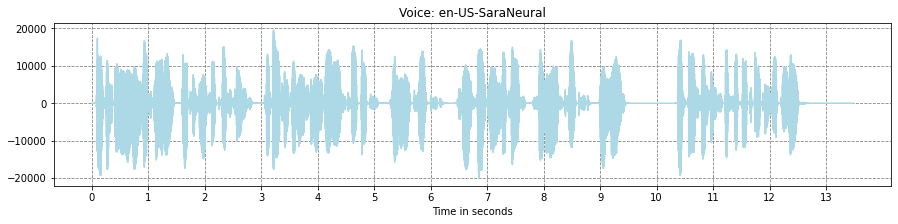

In [62]:
video_chatbot("What can you do?")

output_file = audio_playback()
Audio(output_file)

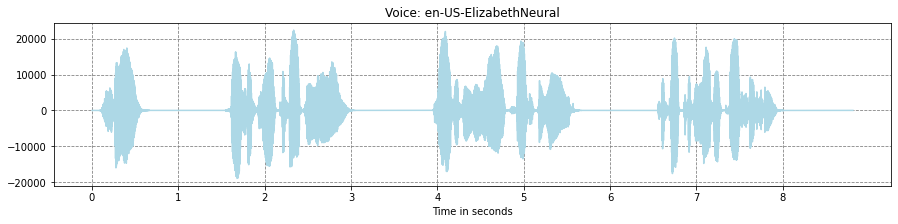

In [63]:
video_chatbot("Can you tell a joke about AI?")

output_file = audio_playback('EN')
Audio(output_file)

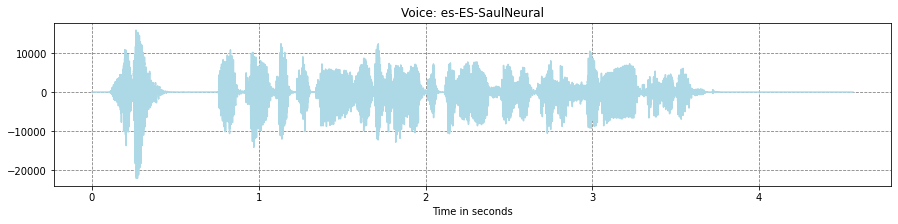

In [64]:
video_chatbot("Is it about Microsoft?")

output_file = audio_playback('ES')
Audio(output_file)

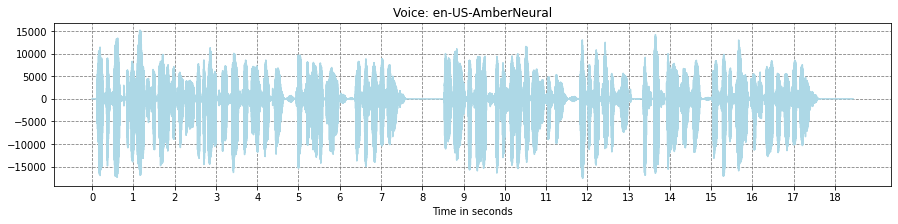

In [65]:
video_chatbot("What is Microsoft?")

output_file = audio_playback()
Audio(output_file)

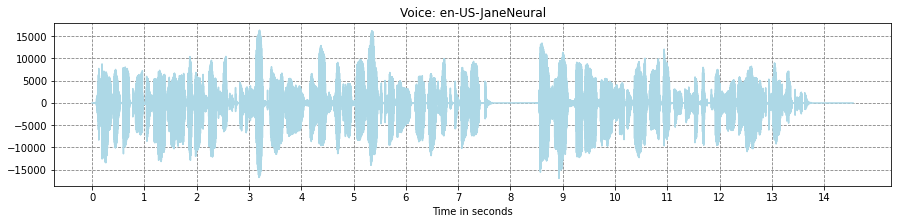

In [66]:
video_chatbot("Who is Chandler Baker?")

output_file = audio_playback()
Audio(output_file)

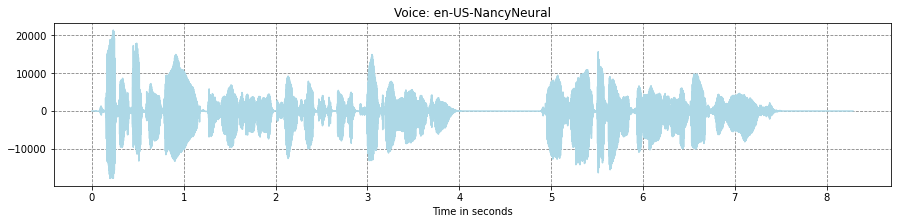

In [67]:
video_chatbot("Who is Bobby Akinboro?")

output_file = audio_playback()
Audio(output_file)

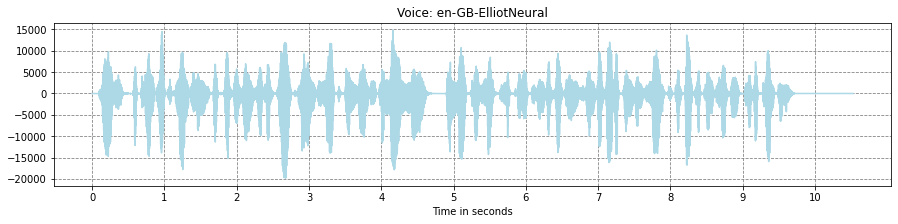

In [68]:
video_chatbot("Is it about growth mindset?")

output_file = audio_playback()
Audio(output_file)

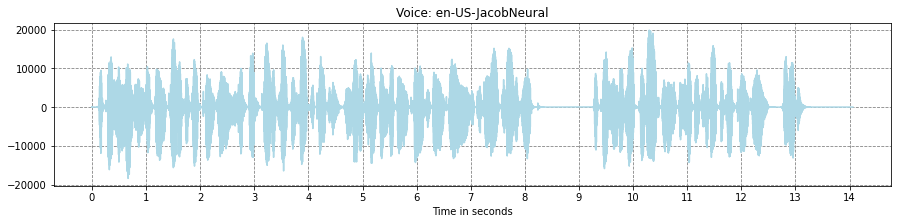

In [69]:
video_chatbot("Could you summarize the content about the give campaign?")

output_file = audio_playback()
Audio(output_file)

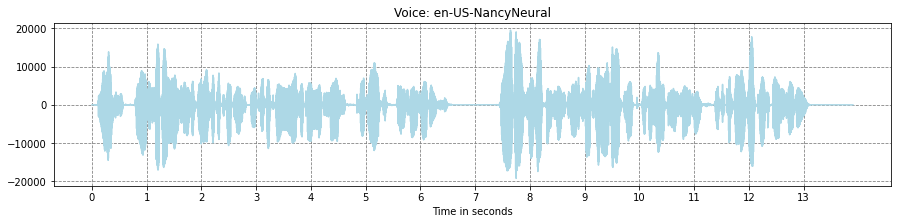

In [70]:
video_chatbot("Do we have something related to music?")

output_file = audio_playback()
Audio(output_file)

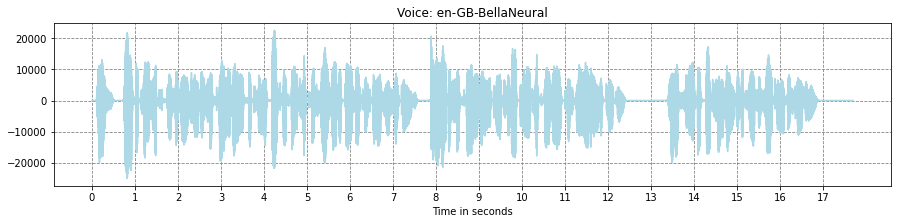

In [71]:
video_chatbot("Do we have something related to solving bugs?")

output_file = audio_playback()
Audio(output_file)

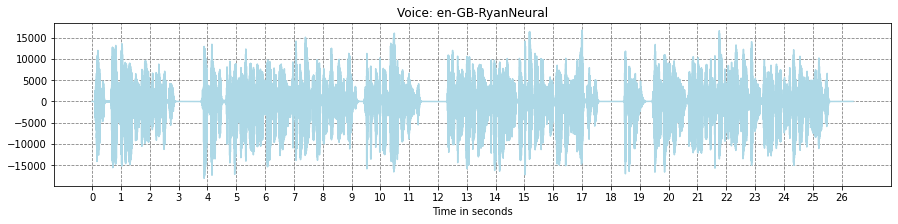

In [72]:
video_chatbot("Any mentions to managers?")

output_file = audio_playback()
Audio(output_file)

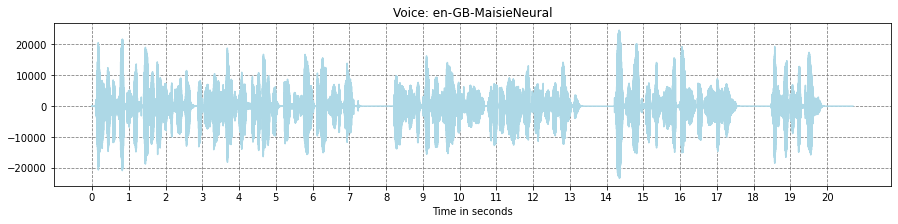

In [73]:
video_chatbot("You are a Twitter redactor. Write a tweet message about the Microsoft managers described in this video?")

output_file = audio_playback()
Audio(output_file)

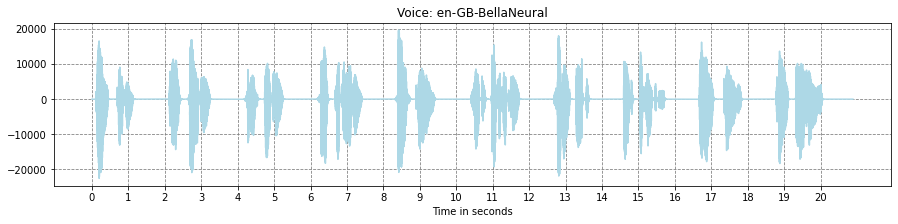

In [74]:
video_chatbot("Could you describe with 10 keywords")

output_file = audio_playback()
Audio(output_file)

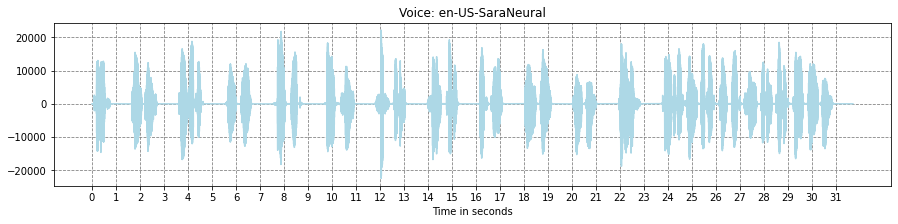

In [75]:
video_chatbot("Could you describe with 10 keywords and saved them into a python list?")

output_file = audio_playback()
Audio(output_file)

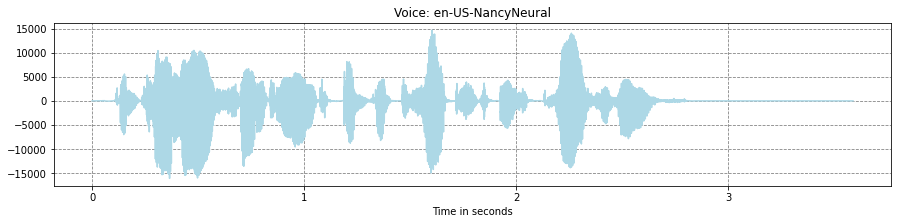

In [76]:
video_chatbot("What is the general sentiment of the text? Is it positive or negative?")

output_file = audio_playback()
Audio(output_file)

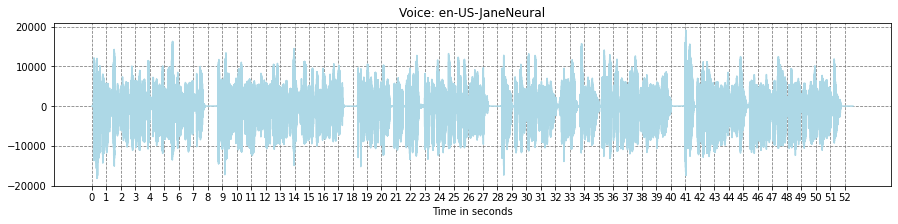

In [77]:
video_chatbot("Why the general sentiment is positive?")

output_file = audio_playback()
Audio(output_file)

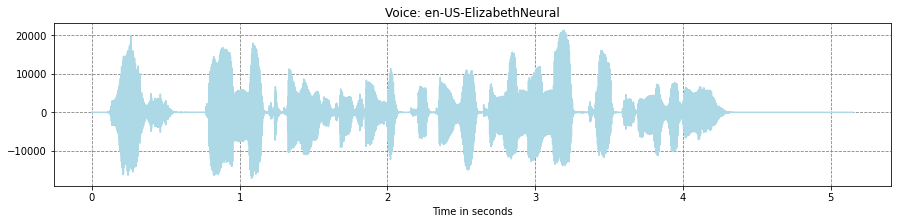

In [78]:
video_chatbot("Do we have people working on their laptop in the video?")

output_file = audio_playback()
Audio(output_file)

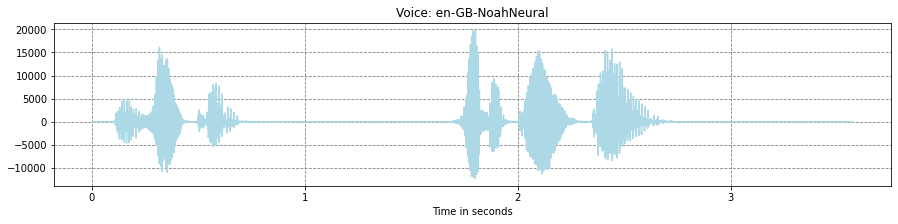

In [79]:
video_chatbot("Thank you. Have a good day!")

output_file = audio_playback()
Audio(output_file)

We can use LangChain, Azure OpenAI Service, and Faiss to build a ChatGPT-like experience, but over private data from our video using Azure Computer Vision Florence.

## 12. Gradio Webapp

In [80]:
def video_gradio_chatbot(query, lang):
    """
    Function to call the Azure Open AI service for a gradio app
    """
    chat_history = []
    result = qa({"question": query, "chat_history": chat_history})
    bot_answer = result["answer"]
    input_file = os.path.join(OUTPUT_DIR, "answer.txt")
    output_file = os.path.join(AUDIO_DIR, "output.wav")
    
    path = '/translate?api-version=3.0'
    
    voice_list_en = [
        "en-US-AmberNeural",
        "en-US-AnaNeural",
        "en-US-AriaNeural",
        "en-US-AshleyNeural",
        "en-US-BrandonNeural",
        "en-US-ChristopherNeural",
        "en-US-CoraNeural",
        "en-US-DavisNeural",
        "en-US-ElizabethNeural",
        "en-US-EricNeural",
        "en-US-GuyNeural",
        "en-US-JacobNeural",
        "en-US-JaneNeural",
        "en-US-JasonNeural",
        "en-US-JennyNeural",
        "en-US-MichelleNeural",
        "en-US-MonicaNeural",
        "en-US-NancyNeural",
        "en-US-RogerNeural1",
        "en-US-SaraNeural",
        "en-US-SteffanNeural",
        "en-US-TonyNeural",
        "en-GB-AbbiNeural",
        "en-GB-AlfieNeural",
        "en-GB-BellaNeural",
        "en-GB-ElliotNeural",
        "en-GB-EthanNeural",
        "en-GB-HollieNeural",
        "en-GB-LibbyNeural",
        "en-GB-MaisieNeural",
        "en-GB-NoahNeural",
        "en-GB-OliverNeural",
        "en-GB-OliviaNeural",
        "en-GB-RyanNeural",
        "en-GB-SoniaNeural"
        "en-GB-ThomasNeural"
    ]
      
    voice_list_fr = [
        "fr-FR-AlainNeural",
        "fr-FR-BrigitteNeural",
        "fr-FR-CelesteNeural",
        "fr-FR-ClaudeNeural",
        "fr-FR-CoralieNeural",
        "fr-FR-EloiseNeural",
        "fr-FR-HenriNeural",
        "fr-FR-JacquelineNeural",
        "fr-FR-JeromeNeural",
        "fr-FR-JosephineNeural",
        "fr-FR-MauriceNeural",
        "fr-FR-YvesNeural",
        "fr-FR-YvetteNeural",
    ]
        
    voice_list_es = [
        "es-ES-AbrilNeura",
        "es-ES-AlvaroNeur",
        "es-ES-ArnauNeura",
        "es-ES-DarioNeura",
        "es-ES-EliasNeura",
        "es-ES-ElviraNeur",
        "es-ES-EstrellaNe",
        "es-ES-IreneNeura",
        "es-ES-LaiaNeural",
        "es-ES-LiaNeural",
        "es-ES-NilNeural",
        "es-ES-SaulNeural",
        "es-ES-TeoNeural",
        "es-ES-TrianaNeur",
        "es-ES-VeraNeural",

    ]
    
    if lang == 'EN':
        # Let's choose a random voice from the list
        voice = voice_list_en[random.randint(0, len(voice_list_en) - 1)]
    
    elif lang == 'FR':
        voice = voice_list_fr[random.randint(0, len(voice_list_fr) - 1)]
        
        params = '&from=en&to=fr'
        constructed_url = AZURE_TRANSLATOR_ENDPOINT + path + params
        headers = {
            'Ocp-Apim-Subscription-Key': AZURE_TRANSLATOR_KEY,
            'Ocp-Apim-Subscription-Region': AZURE_TRANSLATOR_REGION,
            'Content-type': 'application/json',
            'X-ClientTraceId': str(uuid.uuid4())
        }

        # Transting into French
        body = [{'text': bot_answer}]
        request = requests.post(constructed_url, headers=headers, json=body)
        response = request.json()
        bot_answer = response[0]['translations'][0]['text']
    
    elif lang == 'ES':
        # Let's choose a random voice from the list
        voice = voice_list_es[random.randint(0, len(voice_list_es) - 1)]
        
        params = '&from=en&to=es'
        constructed_url = AZURE_TRANSLATOR_ENDPOINT + path + params
        headers = {
            'Ocp-Apim-Subscription-Key': AZURE_TRANSLATOR_KEY,
            'Ocp-Apim-Subscription-Region': AZURE_TRANSLATOR_REGION,
            'Content-type': 'application/json',
            'X-ClientTraceId': str(uuid.uuid4())
        }

        # Transting into Spanish
        body = [{'text': bot_answer}]
        request = requests.post(constructed_url, headers=headers, json=body)
        response = request.json()
        bot_answer = response[0]['translations'][0]['text']
    
    # Speech Config
    speech_config.speech_synthesis_voice_name = voice
    
    # Text to Speech
    audio_output = AudioOutputConfig(filename=output_file)
    synthesizer = SpeechSynthesizer(speech_config=speech_config,
                                    audio_config=audio_output)
    
    # Result
    result = synthesizer.speak_text_async(bot_answer).get()
    
    # Plot
    sound = AudioSegment.from_wav(output_file)
    raw_data = sound.raw_data
    sample_rate = sound.frame_rate
    sample_size = sound.sample_width
    channels = sound.channels
    data = np.frombuffer(raw_data, dtype=np.int16)
    time = np.arange(0, len(data)) / sample_rate
    
    amplitude_plot = os.path.join(OUTPUT_DIR, "amplitude.jpg")
    plt.figure(figsize=(15, 3))
    plt.grid(True, color='gray', linestyle='--')
    plt.plot(time, data, color='lightblue')
    plt.xticks(np.arange(0, len(data) / sample_rate, step=1))
    plot_title = "Voice: " + str(voice)
    plt.title(plot_title)
    plt.xlabel('Time in seconds')
    plt.savefig(amplitude_plot)
    
    return bot_answer, output_file, amplitude_plot

In [81]:
logo = "https://github.com/retkowsky/images/blob/master/aoai.jpg?raw=true"
image = "<center> <img src= {} width=240px></center>".format(logo)
title = "Video chatbot - Powered by Azure AI"
footnote = "Powered by Azure OpenAI and Azure Cognitive Services"

examples = [
    ["Can you tell a joke?"],
    ["What can you do for me?"],
    ["What is Microsoft?"],
    ["Could you summarize the content about the give campaign?"],
    ["Do we have something related to solving bugs?"],
    ["Could you summarize the content about the give campaign?"],
    ["You are a Twitter redactor. Write a tweet message about the Microsoft managers described in this video?"],
    ["Could you describe with 10 keywords and saved them into a python list?"],
    ["Thank you. Have a good day!"],
]

inputs = [
    gr.inputs.Textbox(lines=3,
                      label="Your query", default="Hello. Who are you?"),
    gr.inputs.Radio(choices=['EN', 'ES', 'FR'],
                    label="Audio language",
                    default='EN'),
]

outputs = [
    gr.outputs.Textbox(label="Azure Open AI results"),
    gr.outputs.Audio(label="Audio", type='filepath'),
    gr.outputs.Image(label="Output Image", type="filepath"),
]

# Webapp
webapp = gr.Interface(fn=video_gradio_chatbot,
                      inputs=inputs,
                      outputs=outputs,
                      description=image,
                      title=title,
                      examples=examples,
                      article=footnote,
                      theme="derekzen/stardust",
                     )

# Running the webapp
webapp.launch(share=True)

Running on local URL:  http://127.0.0.1:7860
Running on public URL: https://b73d806911704039d8.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades (NEW!), check out Spaces: https://huggingface.co/spaces


### Some examples

<img src="gradioapp.jpg">
<img src="gradioapp2.jpg">
<img src="gradioapp3.jpg">
<img src="gradioapp4.jpg">